# Working with DNA

In [ ]:
http://blog.adnansiddiqi.me/python-for-bioinformatics-getting-started-with-sequence-analysis-in-python/

https://www.kaggle.com/thomasnelson/working-with-dna-sequence-data-for-ml

https://www.kaggle.com/thomasnelson/working-with-dna-sequence-data-for-ml-part-2
    
https://machinelearningmastery.com/sequence-classification-lstm-recurrent-neural-networks-python-keras/

In [ ]:
https://keras-dna.readthedocs.io/en/latest/
    
https://keras-dna.readthedocs.io/en/latest/sparse/

In [ ]:
Covid-19 prediction Project

https://github.com/rdbch/COVID-19-Forecast
    
https://www.ncbi.nlm.nih.gov/pmc/articles/PMC7955925/

In [ ]:
https://pythonprogramminglanguage.com/bag-of-words/
https://victorzhou.com/blog/bag-of-words/

In [ ]:
working on covid data

https://www.kaggle.com/c/stanford-covid-vaccine/discussion/182320

In [ ]:
Classifying DNA Sequences-Markov Models-KNN-SVM

https://www.kaggle.com/bulentsiyah/classifying-dna-sequences-markov-models-knn-svm

In [ ]:
NLP Text Mining - Disease behaviour

https://www.kaggle.com/cstefanache/nlp-text-mining-disease-behaviour

In [ ]:
Coronavirus genome Sequences
https://www.kaggle.com/paultimothymooney/coronavirus-genome-sequence

In [ ]:
COVID-19: Proteins identification with Biopython
https://www.kaggle.com/amiiiney/covid-19-proteins-identification-with-biopython

In [ ]:
Unwrapping the COVID-19 genomes
https://www.kaggle.com/amansingh29/unwrapping-the-covid-19-genomes

In [ ]:
OpenVaccine: COVID-19 mRNA Vaccine Degradation Prediction
Urgent need to bring the COVID-19 vaccine to mass production

https://www.kaggle.com/c/stanford-covid-vaccine/discussion/182320

in biological computing, working with DNA sequence data is commonplace. Becomming familiar with the Python package Biopython will really help you when dealing with biological sequence data in Python. DNA sequence data frequently are contained in a file format called "fasta" format. Fasta format is simply a single line prefixed by the greater than symbol that contains annotations and another line that contains the sequence:

>information about the sequence
ATGTTTCGCATCACCAACATTGAGTTTCTTCCCGAATACCGACAAAAGGAGTCCAGGGAA

The file can contain one or many DNA sequences. There are lots of other formats, but fasta is the most common.

Here is a brief example of how to work with DNA sequence in fasta format using Biopython. The sequence object will contain attributes such as id and sequence that you can work with directly.

In [1]:
from Bio import SeqIO
for seq_record in SeqIO.parse('d://BioPython//first.fasta', "fasta"):
    print(seq_record.id)
    print(seq_record.seq)

sp|P25730|FMS1_ECOLI
MKLKKTIGAMALATLFATMGASAVEKTISVTASVDPTVDLLQSDGSALPNSVALTYSPAVNNFEAHTINTVVHTNDSDKGVVVKLSADPVLSNVLNPTLQIPVSVNFAGKPLSTTGITIDSNDLNFASSGVNKVSSTQKLSIHADATRVTGGALTAGQYQGLVSIILTKSTTTTTTTKGT
sp|P15488|FMS3_ECOLI
MLKIKYLLIGLSLSAMSSYSLAAAGPTLTKELALNVLSPAALDATWAPQDNLTLSNTGVSNTLVGVLTLSNTSIDTVSIASTNVSDTSKNGTVTFAHETNNSASFATTISTDNANITLDKNAGNTIVKTTNGSQLPTNLPLKFITTEGNEHLVSGNYRANITITSTIKGGGTKKGTTDKK


In [4]:
from Bio import SeqIO
for seq_record in SeqIO.parse('d://BioPython//sample.fasta', "fasta"):
    print(seq_record.id)
    print(seq_record.seq)

# Machine learning with DNA sequence data
Now that we can load and manipulate biological sequence data easily, how can we use it for machine learning or deep learning? There are 3 general approaches for this. 

1) encode the sequence information as an ordinal vector and work with that directly, 

2) one-hot encode the sequence letters and use the resulting array and 

3) treat the DNA sequence as a language (text) and use various "language" processing methods.



## Ordinal encoding DNA sequence data


One approach is to encode each nucleotide characters as an ordinal values. 

For example “ATGC” becomes [0.25, 0.5, 0.75, 1.0]. Any other base such as “N” can be a 0. Allen Chieng, Hoon Choong and Nung Kion Lee showed in their paper "Evaluation of Convolutionary Neural Networks Modeling of DNA Sequences using Ordinal versus one-hot Encoding Method" that this works surprisingly well.

Let's first create some utility functions such as for creating a numpy array object from a sequence string, and a label encoder with the DNA sequence alphabet "a", "c", "g" and "t", but also a character for anything else, "n".

1. re.sub(pattern, replacement, string)	Find and replaces all occurrences of pattern with replacement

2. re.sub(pattern, replacement, string, count=1)	Find and replaces only first the occurrences of pattern with replacement

3. re.sub(pattern, replacement, string, count=n)	Find and replaces first n occurrences of pattern with the replacement

In [2]:
# function to convert a DNA sequence string to a numpy array
# converts to lower case, changes any non 'acgt' characters to 'n'
import numpy as np
import re
def string_to_array(my_string):
    my_string = my_string.lower()
    my_string = re.sub('[^acgt]', 'z', my_string)
    my_array = np.array(list(my_string))
    return my_array

# create a label encoder with 'acgtn' alphabet
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
label_encoder.fit(np.array(['a','c','g','t','z']))

LabelEncoder()

In [54]:
st='ACCTCGGCSKLCXAACCTC'
en={'A':0.25,'C':0.75,'G':0.75,'T':1}
L=[]
for i in st:
    if i in ['A','C','T','G']:
        L.append(i)
print(L)

['A', 'C', 'C', 'T', 'C', 'G', 'G', 'C', 'C', 'A', 'A', 'C', 'C', 'T', 'C']


In [68]:
en={'A':0.25,'C':0.75,'G':0.75,'T':1}
for i in en:
    print(en[i])

0.25
0.75
0.75
1


In [77]:
def SeqToArr(seq):
    #st='ACCTCGGCSKLCXAACCTC'
    en={'A':0.25,'C':0.75,'G':0.75,'T':1}
    L=[]
    for i in seq.upper():
        if i in en.keys():
            L.append(en[i])
        else:
            L.append(0.0)
    return np.array(L)

In [78]:
st='ACCKTCGGCSKLCXAACNCTKC'
code=SeqToArr(st)
#code=np.array(code)
print(code)

[0.25 0.75 0.75 0.   1.   0.75 0.75 0.75 0.75 0.   0.   0.   0.75 0.
 0.25 0.25 0.75 0.   0.75 1.   0.   0.75]


And here is a function to encode a DNA sequence string as an ordinal vector. It returns a numpy array with a=0.25, c=0.50, g=0.75, t=1.00, n=0.00.

In [3]:
# function to encode a DNA sequence string as an ordinal vector
# returns a numpy vector with a=0.25, c=0.50, g=0.75, t=1.00, n=0.00
def ordinal_encoder(my_array):
    integer_encoded = label_encoder.transform(my_array)
    float_encoded = integer_encoded.astype(float)
    float_encoded[float_encoded == 0] = 0.25 # A
    float_encoded[float_encoded == 1] = 0.50 # C
    float_encoded[float_encoded == 2] = 0.75 # G
    float_encoded[float_encoded == 3] = 1.00 # T
    float_encoded[float_encoded == 4] = 0.00 # anything else, z
    return float_encoded

In [4]:
test_sequence = 'AACGCGCTTNN'
ordinal_encoder(string_to_array(test_sequence))

array([0.25, 0.25, 0.5 , 0.75, 0.5 , 0.75, 0.5 , 1.  , 1.  , 0.  , 0.  ])

import re
txt = "ATCGGGCTAACTTCCAAGGGGTATCGATCG"
x = re.search("GTATCG*", txt)
print(x)



import re

txt = "The rain in Spain"
x = re.search("ai", txt)
print(x) #this will print an object


txt = "The rain in Spain"
x = re.search("^The.*Spain$", txt)
if x:
  print("YES! We have a match!")
else:
  print("No match")


import re

txt = "The rain in Spain falls mainly in the plain!"

#Check if the string contains "ai" followed by 1 or more "x" characters:

x = re.findall("in the+", txt)

print(x)

if x:
  print("Yes, there is at least one match!")
  print(x)
else:
  print("No match")



# One-hot encoding DNA sequence data
Another approach is to use one-hot encoding to represent the DNA sequence. This is widely used in dep learning methods and lends itself well to algorithms like convolutional neural networks. 

In this example, “ATGC” would become [0,0,0,1], [0,0,1,0], [0,1,0,0], [1,0,0,0]. 

And these one-hot encoded vectors can either be concatenated or turned into 2 dimensional arrays. 

Let's try it. Here is a function to do the one-hot encoding:

In [5]:
# function to one-hot encode a DNA sequence string
# non 'acgt' bases (n) are 0000
# returns a L x 4 numpy array
from sklearn.preprocessing import OneHotEncoder
def one_hot_encoder(my_array):
    integer_encoded = label_encoder.transform(my_array)
    onehot_encoder = OneHotEncoder(sparse=False, dtype=int)
    integer_encoded = integer_encoded.reshape(len(integer_encoded), 1)
    onehot_encoded = onehot_encoder.fit_transform(integer_encoded)
    onehot_encoded = np.delete(onehot_encoded, -1, 1)
    return onehot_encoded

In [6]:
test_sequence = 'AACGCGGTTNN'
one_hot_encoder(string_to_array(test_sequence))

array([[1, 0, 0, 0],
       [1, 0, 0, 0],
       [0, 1, 0, 0],
       [0, 0, 1, 0],
       [0, 1, 0, 0],
       [0, 0, 1, 0],
       [0, 0, 1, 0],
       [0, 0, 0, 1],
       [0, 0, 0, 1],
       [0, 0, 0, 0],
       [0, 0, 0, 0]])

### Treating DNA sequence as a "language", otherwise known as k-mer counting

A challenge that remains is that none of these above methods results in vectors of uniform length, and that is a requirement for feeding data to a classification or regression algorithm. So with the above methods you have to resort to things like truncating sequences or padding with "n" or "0" to get vectors of uniform length.

DNA and protein sequences can be viewed metaphorically as the language of life. The language encodes instructions as well as function for the molecules that are found in all life forms. The sequence language analogy continues with the genome as the book, subsequences (genes and gene families) are sentences and chapters, k-mers and peptides (motifs) are words, and nucleotide bases and amino acids are the alphabet. Since the analogy seems so apt, it stands to reason that the amazing work done in the natural language processing field should also apply to the natural language of DNA and protein sequences.

take the long biological sequence and break it down into k-mer length overlapping “words”. For example, if I use "words" of length 6 (hexamers), “ATGCATGCA” becomes: ‘ATGCAT’, ‘TGCATG’, ‘GCATGC’, ‘CATGCA’. Hence our example sequence is broken down into 4 hexamer words.

In genomics, we refer to these types of manipulations as "k-mer counting", or counting the occurances of each possible k-mer sequence. There are specialized tools for this, but the Python natural language processing tools make it supe easy.

Here is a function that can be used to convert any sequence (string) to overlapping k-mer words:

In [7]:
def getKmers(sequence, size):
    return [sequence[x:x+size].lower() for x in range(len(sequence) - size + 1)]

In [8]:
mySeq = 'CATGGCCATCCCCCCCCGAGCGGGGGGGGGG'
sentence=getKmers(mySeq, size=6)

In [9]:
print(sentence)

['catggc', 'atggcc', 'tggcca', 'ggccat', 'gccatc', 'ccatcc', 'catccc', 'atcccc', 'tccccc', 'cccccc', 'cccccc', 'cccccc', 'cccccg', 'ccccga', 'cccgag', 'ccgagc', 'cgagcg', 'gagcgg', 'agcggg', 'gcgggg', 'cggggg', 'gggggg', 'gggggg', 'gggggg', 'gggggg', 'gggggg']


It returns a list of k-mer "words." You can then join the "words" into a "sentence", then apply your favorite natural language processing methods on the "sentences" as you normally would.

In [149]:
def getWords(seq,size):
    seqWords=[]
    for i in range(len(seq)):
        seqWords.append(seq[i:i+size])
    return seqWords

In [150]:
mySeq = 'CATGGCCATCCCCCCCCGAGCGGGGGGGGGG'
wordlist=' '.join(getWords(mySeq,5))
wordlist

'CATGG ATGGC TGGCC GGCCA GCCAT CCATC CATCC ATCCC TCCCC CCCCC CCCCC CCCCC CCCCC CCCCG CCCGA CCGAG CGAGC GAGCG AGCGG GCGGG CGGGG GGGGG GGGGG GGGGG GGGGG GGGGG GGGGG GGGG GGG GG G'

You can tune both the word length and the amount of overlap. This allows you to determine how sequence information and vocabulary size will be important in your application. 

For example, if you use words of length 6, and there are 4 letters, you have a vocabulary of size 4096 possible words. You can then go on and create a bag-of-words model like you would in NLP.

Let's make a couple more "sentences" to make it more interesting.

In [11]:
mySeq = 'CATGGCCATCCCCCCCCGAGCGGGGGGGGGG'
sentence1=' '.join(getKmers(mySeq, size=6))
sentence1

'catggc atggcc tggcca ggccat gccatc ccatcc catccc atcccc tccccc cccccc cccccc cccccc cccccg ccccga cccgag ccgagc cgagcg gagcgg agcggg gcgggg cggggg gggggg gggggg gggggg gggggg gggggg'

In [12]:
mySeq2 = 'GATGGCCATCCCCGCCCGAGCGGGGGGGG'
mySeq3 = 'CATGGCCATCCCCGCCCGAGCGGGCGGGG'
sentence2 = ' '.join(getKmers(mySeq2, size=6))
sentence3 = ' '.join(getKmers(mySeq3, size=6))

In [153]:
sentence2 

'gatggc atggcc tggcca ggccat gccatc ccatcc catccc atcccc tccccg ccccgc cccgcc ccgccc cgcccg gcccga cccgag ccgagc cgagcg gagcgg agcggg gcgggg cggggg gggggg gggggg gggggg'

In [13]:
# Creating the Bag of Words model
from sklearn.feature_extraction.text import CountVectorizer
CV=CountVectorizer()
CV.fit_transform([sentence1,sentence2,sentence3]).toarray()

array([[1, 1, 1, 1, 1, 1, 3, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0,
        0, 1, 1, 0, 0, 5, 1, 0, 1],
       [1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1,
        0, 1, 1, 0, 0, 3, 0, 1, 1],
       [1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1,
        1, 1, 1, 1, 1, 0, 0, 1, 1]], dtype=int64)

### Demo of Coutvectorizer

In [117]:
from sklearn.feature_extraction.text import CountVectorizer

In [137]:
corpus = ['This is the first document.','This document is the second document.','And this is the third one.','Is this the first document?']
vectorizer = CountVectorizer()
x=vectorizer.fit_transform(corpus)
vectorizer.get_feature_names()


['and', 'document', 'first', 'is', 'one', 'second', 'the', 'third', 'this']

In [138]:
x.toarray()

array([[0, 1, 1, 1, 0, 0, 1, 0, 1],
       [0, 2, 0, 1, 0, 1, 1, 0, 1],
       [1, 0, 0, 1, 1, 0, 1, 1, 1],
       [0, 1, 1, 1, 0, 0, 1, 0, 1]], dtype=int64)

In [135]:
vectorizer2 = CountVectorizer(analyzer='word', ngram_range=(2, 2))
x=vectorizer2.fit_transform(corpus)
x.toarray()


array([[0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0],
       [0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0],
       [1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0],
       [0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1]], dtype=int64)

In [136]:
print(vectorizer2.get_feature_names())

['and this', 'document is', 'first document', 'is the', 'is this', 'second document', 'the first', 'the second', 'the third', 'third one', 'this document', 'this is', 'this the']


## lets build a classification model that can predict a gene's function based on the DNA sequence of the coding sequence alone.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline  

In [3]:
import pandas as pd
human=pd.read_table("d://BioPython//human_data.txt")
dog=pd.read_table("d://BioPython//dog_data.txt")
chimp=pd.read_table("d://BioPython//chimp_data.txt")
display(human,dog,chimp)

,sequence,class
0,ATGCCCCAACTAAATACTACCGTATGGCCCACCATAATTACCCCCA...,4
1,ATGAACGAAAATCTGTTCGCTTCATTCATTGCCCCCACAATCCTAG...,4
2,ATGTGTGGCATTTGGGCGCTGTTTGGCAGTGATGATTGCCTTTCTG...,3
3,ATGTGTGGCATTTGGGCGCTGTTTGGCAGTGATGATTGCCTTTCTG...,3
4,ATGCAACAGCATTTTGAATTTGAATACCAGACCAAAGTGGATGGTG...,3
...,...,...
4375,ATGGAAGATTTGGAGGAAACATTATTTGAAGAATTTGAAAACTATT...,0
4376,ATGCAGTCCTTTCGGGAGCAAAGCAGTTACCACGGAAACCAGCAAA...,6
4377,ATGCAGTCCTTTCGGGAGCAAAGCAGTTACCACGGAAACCAGCAAA...,6
4378,ATGGGGCACCTGGTTTGCTGTCTGTGTGGCAAGTGGGCCAGTTACC...,6


,sequence,class
0,ATGCCACAGCTAGATACATCCACCTGATTTATTATAATCTTTTCAA...,4
1,ATGAACGAAAATCTATTCGCTTCTTTCGCTGCCCCCTCAATAATAG...,4
2,ATGGAAACACCCTTCTACGGCGATGAGGCGCTGAGCGGCCTGGGCG...,6
3,ATGTGCACTAAAATGGAACAGCCCTTCTACCACGACGACTCATACG...,6
4,ATGAGCCGGCAGCTAAACAGAAGCCAGAACTGCTCCTTCAGTGACG...,0
...,...,...
815,ATGGTCGGTCCGGAGAAGGAGCAGAGCTGGATCCCTAAGATCTTCA...,5
816,ATGGCGGCGACGGTGGCTGCGGCGGCCGCCGACGCGGGGCCGGGGG...,6
817,ATGAGCTCGGCCGACAAGGCCCGGGTGGGGCCCGCGGCCGACGGGC...,6
818,GCCCCGAGGATGGGCAGGGTCCCGCTGGCCTGGTGCTTGGCGCTGT...,1


,sequence,class
0,ATGCCCCAACTAAATACCGCCGTATGACCCACCATAATTACCCCCA...,4
1,ATGAACGAAAATCTATTCGCTTCATTCGCTGCCCCCACAATCCTAG...,4
2,ATGGCCTCGCGCTGGTGGCGGTGGCGACGCGGCTGCTCCTGGAGGC...,4
3,ATGGCCTCGCGCTGGTGGCGGTGGCGACGCGGCTGCTCCTGGAGGC...,4
4,ATGGGCAGCGCCAGCCCGGGTCTGAGCAGCGTGTCCCCCAGCCACC...,6
...,...,...
1677,ATGCTGAGCGGAGCGGCTGGGGCTGCGCGGCGTGGCGGAGCAGCGC...,5
1678,ATGCTGAGCGGAGCGGCTGGGGCTGCGCGGCGTGGCGGAGCAGCGC...,5
1679,ATGAAGCGACCCAAGGAGCCGAGCGGCTCCGACGGGGAGTCCGACG...,6
1680,ATGACTGGAACCCCAAAGACTCAAGAAGGAGCTAAAGATCTTGAAG...,3


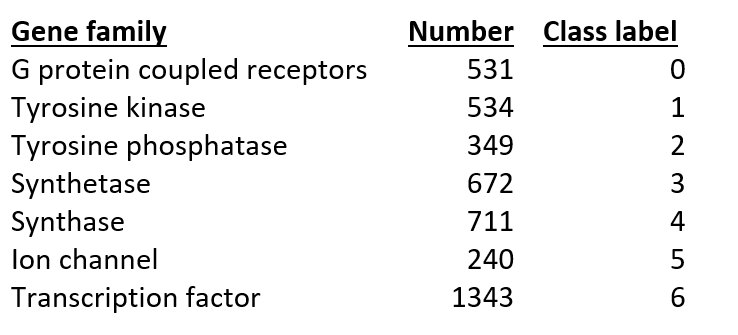

Let's define a function to collect all possible overlapping k-mers of a specified length from any sequence string.

In [4]:
# function to convert sequence strings into k-mer words, default size = 6 (hexamer words)
def getKmers(sequence, size=6):
    return [sequence[x:x+size].lower() for x in range(len(sequence) - size + 1)]

Now we can convert our training data sequences into short overlapping k-mers of legth 6. Lets do that for each species of data we have using our getKmers function.

In [5]:
human['words'] = human.apply(lambda x: getKmers(x['sequence']), axis=1)

In [6]:
human = human.drop('sequence', axis=1)

In [7]:
human

,class,words
0,4,"[atgccc, tgcccc, gcccca, ccccaa, cccaac, ccaac..."
1,4,"[atgaac, tgaacg, gaacga, aacgaa, acgaaa, cgaaa..."
2,3,"[atgtgt, tgtgtg, gtgtgg, tgtggc, gtggca, tggca..."
3,3,"[atgtgt, tgtgtg, gtgtgg, tgtggc, gtggca, tggca..."
4,3,"[atgcaa, tgcaac, gcaaca, caacag, aacagc, acagc..."
...,...,...
4375,0,"[atggaa, tggaag, ggaaga, gaagat, aagatt, agatt..."
4376,6,"[atgcag, tgcagt, gcagtc, cagtcc, agtcct, gtcct..."
4377,6,"[atgcag, tgcagt, gcagtc, cagtcc, agtcct, gtcct..."
4378,6,"[atgggg, tggggc, ggggca, gggcac, ggcacc, gcacc..."


In [8]:
chimp['words'] = chimp.apply(lambda x: getKmers(x['sequence']), axis=1)
chimp = chimp.drop('sequence', axis=1)
dog['words'] = dog.apply(lambda x: getKmers(x['sequence']), axis=1)
dog = dog.drop('sequence', axis=1)

Since we are going to use scikit-learn natural language processing tools to do the k-mer counting, we need to now convert the lists of k-mers for each gene into string sentences of words that the count vectorizer can use. We can also make a y variable to hold the class labels. Let's do that now.

In [176]:
#human_text=list(human['words'])


[['atgccc',
  'tgcccc',
  'gcccca',
  'ccccaa',
  'cccaac',
  'ccaact',
  'caacta',
  'aactaa',
  'actaaa',
  'ctaaat',
  'taaata',
  'aaatac',
  'aatact',
  'atacta',
  'tactac',
  'actacc',
  'ctaccg',
  'taccgt',
  'accgta',
  'ccgtat',
  'cgtatg',
  'gtatgg',
  'tatggc',
  'atggcc',
  'tggccc',
  'ggccca',
  'gcccac',
  'cccacc',
  'ccacca',
  'caccat',
  'accata',
  'ccataa',
  'cataat',
  'ataatt',
  'taatta',
  'aattac',
  'attacc',
  'ttaccc',
  'tacccc',
  'accccc',
  'ccccca',
  'ccccat',
  'cccata',
  'ccatac',
  'catact',
  'atactc',
  'tactcc',
  'actcct',
  'ctcctt',
  'tcctta',
  'ccttac',
  'cttaca',
  'ttacac',
  'tacact',
  'acacta',
  'cactat',
  'actatt',
  'ctattc',
  'tattcc',
  'attcct',
  'ttcctc',
  'tcctca',
  'cctcat',
  'ctcatc',
  'tcatca',
  'catcac',
  'atcacc',
  'tcaccc',
  'caccca',
  'acccaa',
  'cccaac',
  'ccaact',
  'caacta',
  'aactaa',
  'actaaa',
  'ctaaaa',
  'taaaaa',
  'aaaaat',
  'aaaata',
  'aaatat',
  'aatatt',
  'atatta',
  'tattaa',
  'a

In [177]:
print(human_text)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [33]:
len(human_text)

NameError: name 'human_text' is not defined

In [9]:
human_texts = list(human['words'])
for item in range(len(human_texts)):
    human_texts[item] = ' '.join(human_texts[item])
y_h = human.iloc[:, 0].values   

In [10]:
len(human_texts[2])

11766

In [37]:
human_texts[0]

'atgccc tgcccc gcccca ccccaa cccaac ccaact caacta aactaa actaaa ctaaat taaata aaatac aatact atacta tactac actacc ctaccg taccgt accgta ccgtat cgtatg gtatgg tatggc atggcc tggccc ggccca gcccac cccacc ccacca caccat accata ccataa cataat ataatt taatta aattac attacc ttaccc tacccc accccc ccccca ccccat cccata ccatac catact atactc tactcc actcct ctcctt tcctta ccttac cttaca ttacac tacact acacta cactat actatt ctattc tattcc attcct ttcctc tcctca cctcat ctcatc tcatca catcac atcacc tcaccc caccca acccaa cccaac ccaact caacta aactaa actaaa ctaaaa taaaaa aaaaat aaaata aaatat aatatt atatta tattaa attaaa ttaaac taaaca aaacac aacaca acacaa cacaaa acaaac caaact aaacta aactac actacc ctacca taccac accacc ccacct caccta acctac cctacc ctacct tacctc acctcc cctccc ctccct tccctc ccctca cctcac ctcacc tcacca caccaa accaaa ccaaag caaagc aaagcc aagccc agccca gcccat cccata ccataa cataaa ataaaa taaaaa aaaaat aaaata aaataa aataaa ataaaa taaaaa aaaaaa aaaaat aaaatt aaatta aattat attata ttataa tataac ataaca taacaa aacaaa acaaa

In [11]:
y_h

array([4, 4, 3, ..., 6, 6, 6], dtype=int64)

In [12]:
chimp_texts = list(chimp['words'])
for item in range(len(chimp_texts)):
    chimp_texts[item] = ' '.join(chimp_texts[item])
y_c = chimp.iloc[:, 0].values                       # y_c for chimp

dog_texts = list(dog['words'])
for item in range(len(dog_texts)):
    dog_texts[item] = ' '.join(dog_texts[item])
y_d = dog.iloc[:, 0].values        

use sklearn's "Natural Language" Processing tools to convert our k-mer words into uniform length numerical vectors that represent counts for every k-mer in the vocabulary.

In [13]:
# Creating the Bag of Words model using CountVectorizer()
# This is equivalent to k-mer counting
# The n-gram size of 4 was previously determined by testing
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer(ngram_range=(4,4))
X_human = cv.fit_transform(human_texts)
X_chimp = cv.transform(chimp_texts)
X_dog = cv.transform(dog_texts)

In [14]:
print(X_human.shape)
print(X_chimp.shape)
print(X_dog.shape)

(4380, 232414)
(1682, 232414)
(820, 232414)


For human we have 4380 genes converted into uniform length feature vectors of 4-gram k-mer (length 6) counts. For chimp and dog we have the expected same number of features with 1682 and 820 genes respectively.

In [15]:
human['class']

0       4
1       4
2       3
3       3
4       3
       ..
4375    0
4376    6
4377    6
4378    6
4379    6
Name: class, Length: 4380, dtype: int64

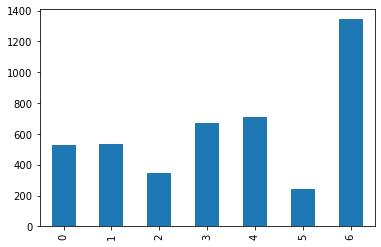

In [43]:
human['class'].value_counts().sort_index().plot.bar()

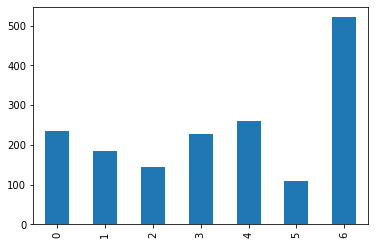

In [216]:
chimp['class'].value_counts().sort_index().plot.bar()

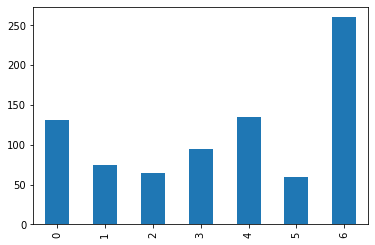

In [44]:
dog['class'].value_counts().sort_index().plot.bar()

So now that we know how to transform our DNA sequences into uniform length numerical vectors in the form of k-mer counts and ngrams, we can now go ahead and build a classification model that can predict the DNA sequence function based only on the sequence itself.

lets use the human data to train the model, holding out 20% of the human data to test the model. Then we can really challenge the model's generalizability by trying to predict sequence function in other species (the chimpanzee and dog).

In [16]:
# Splitting the human dataset into the training set and test set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_human,y_h,test_size = 0.20,random_state=42)

In [17]:
print(X_train.shape)
print(X_test.shape)

(3504, 232414)
(876, 232414)


A multinomial naive Bayes classifier will be created. I previously did some parameter tuning and found the ngram size of 4 (reflected in the Countvectorizer() instance) and a model alpha of 0.1 did the best.

In [18]:
### Multinomial Naive Bayes Classifier ###
# The alpha parameter was determined by grid search previously
from sklearn.naive_bayes import MultinomialNB
classifier = MultinomialNB(alpha=0.1)
classifier.fit(X_train, y_train)

MultinomialNB(alpha=0.1)

In [ ]:
Now let's make predictions on the human hold out test set and see how it performes on unseen data.

In [19]:
y_pred = classifier.predict(X_test)

In [51]:
y_pred

array([2, 0, 4, 6, 3, 6, 4, 2, 6, 6, 0, 6, 0, 6, 6, 6, 6, 1, 4, 1, 6, 3,
       4, 4, 4, 6, 0, 6, 6, 6, 2, 6, 3, 6, 3, 0, 0, 6, 3, 4, 3, 0, 6, 5,
       3, 0, 6, 6, 1, 2, 1, 3, 0, 5, 0, 5, 2, 6, 4, 1, 5, 1, 4, 4, 4, 4,
       4, 3, 4, 2, 2, 3, 4, 5, 0, 3, 6, 1, 6, 1, 4, 1, 6, 3, 1, 6, 6, 4,
       1, 2, 6, 3, 4, 3, 1, 1, 6, 6, 1, 1, 5, 1, 6, 3, 6, 4, 4, 1, 2, 0,
       6, 3, 5, 4, 6, 6, 5, 6, 6, 6, 3, 0, 0, 4, 4, 1, 2, 0, 4, 6, 5, 2,
       5, 6, 1, 2, 4, 4, 6, 1, 3, 2, 3, 5, 6, 6, 1, 5, 6, 4, 3, 6, 6, 6,
       6, 2, 3, 6, 0, 6, 6, 3, 1, 0, 5, 2, 4, 2, 1, 4, 5, 4, 6, 6, 6, 6,
       6, 3, 6, 4, 2, 2, 1, 1, 2, 6, 6, 6, 6, 0, 4, 0, 4, 2, 1, 2, 3, 0,
       6, 4, 6, 1, 2, 1, 4, 4, 3, 5, 6, 6, 6, 0, 4, 1, 0, 1, 3, 3, 5, 0,
       6, 0, 0, 6, 3, 0, 0, 6, 5, 2, 0, 1, 5, 3, 1, 1, 6, 6, 1, 3, 2, 4,
       3, 6, 6, 3, 4, 6, 4, 4, 0, 3, 4, 3, 6, 1, 4, 6, 6, 6, 6, 0, 0, 6,
       6, 6, 6, 4, 4, 3, 3, 1, 4, 6, 4, 6, 4, 2, 3, 2, 6, 3, 3, 6, 2, 6,
       6, 1, 1, 5, 0, 5, 3, 1, 3, 6, 2, 2, 4, 1, 6,

let's look at some model performce metrics like the confusion matrix, accuracy, precision, recall and f1 score. We are getting really good results on our unseen data, so it looks like our model did not overfit to the training data. In a real project I would go back and sample many more train test splits since we have a relatively small data set.

In [20]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score
print("Confusion matrix\n")
print(pd.crosstab(pd.Series(y_test,name="actual"),pd.Series(y_pred,name="predicted")))

def get_metrics(y_test, y_pred):
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    return accuracy, precision, recall, f1
accuracy, precision, recall, f1 = get_metrics(y_test, y_pred)
print("accuracy = %.3f \nprecision = %.3f \nrecall = %.3f \nf1 = %.3f" % (accuracy, precision, recall, f1))

Confusion matrix

predicted   0    1   2    3    4   5    6
actual                                   
0          99    0   0    0    1   0    2
1           0  104   0    0    0   0    2
2           0    0  78    0    0   0    0
3           0    0   0  124    0   0    1
4           1    0   0    0  143   0    5
5           0    0   0    0    0  51    0
6           1    0   0    1    0   0  263
accuracy = 0.984 
precision = 0.984 
recall = 0.984 
f1 = 0.984


Now for the real test. Let's see how our model perfoms on the DNA sequences from other species. First we'll try the Chimpanzee, which we would expect to be very similar to human. Then we will try man's (and woman's) best friend, the Dog DNA sequences.

In [21]:
#Make predictions for the Chimp and dog sequences

# Predicting the chimp, dog and worm sequences
y_pred_chimp = classifier.predict(X_chimp)
y_pred_dog = classifier.predict(X_dog)

In [58]:
# performance on chimp genes
print("Confusion matrix\n")
print(pd.crosstab(pd.Series(y_c, name='Actual'), pd.Series(y_pred_chimp, name='Predicted')))
accuracy, precision, recall, f1 = get_metrics(y_c, y_pred_chimp)
print("accuracy = %.3f \nprecision = %.3f \nrecall = %.3f \nf1 = %.3f" % (accuracy, precision, recall, f1))

Confusion matrix

Predicted    0    1    2    3    4    5    6
Actual                                      
0          232    0    0    0    0    0    2
1            0  184    0    0    0    0    1
2            0    0  144    0    0    0    0
3            0    0    0  227    0    0    1
4            2    0    0    0  254    0    5
5            0    0    0    0    0  109    0
6            0    0    0    0    0    0  521
accuracy = 0.993 
precision = 0.994 
recall = 0.993 
f1 = 0.993


In [22]:
# performance on dog genes
print("Confusion matrix\n")
print(pd.crosstab(pd.Series(y_d, name='Actual'), pd.Series(y_pred_dog, name='Predicted')))
accuracy, precision, recall, f1 = get_metrics(y_d, y_pred_dog)
print("accuracy = %.3f \nprecision = %.3f \nrecall = %.3f \nf1 = %.3f" % (accuracy, precision, recall, f1))

Confusion matrix

Predicted    0   1   2   3    4   5    6
Actual                                  
0          127   0   0   0    0   0    4
1            0  63   0   0    1   0   11
2            0   0  49   0    1   0   14
3            1   0   0  81    2   0   11
4            4   0   0   1  126   0    4
5            4   0   0   0    1  53    2
6            0   0   0   0    0   0  260
accuracy = 0.926 
precision = 0.934 
recall = 0.926 
f1 = 0.925


The model seems to perform well on human data. It also does on Chimpanzee. That might not be a surprize since the chimp and human are so similar genetically. The performance on dog is not quite as good. We would expect this since the dog is more divergent from human than the chimpanze.

In [23]:
#Applying Multimonial Logistic Regression

from sklearn.linear_model import LogisticRegression
lg=LogisticRegression(multi_class='multinomial',solver='newton-cg')

In [24]:
lg.fit(X_train, y_train)
y_pred=lg.predict(X_test)

In [25]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score
print("Confusion matrix\n")
print(pd.crosstab(pd.Series(y_test,name="actual"),pd.Series(y_pred,name="predicted")))

def get_metrics(y_test, y_pred):
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    return accuracy, precision, recall, f1
accuracy, precision, recall, f1 = get_metrics(y_test, y_pred)
print("accuracy = %.3f \nprecision = %.3f \nrecall = %.3f \nf1 = %.3f" % (accuracy, precision, recall, f1))

Confusion matrix

predicted   0   1   2    3    4   5    6
actual                                  
0          92   0   0    1    0   0    9
1           0  99   0    2    0   0    5
2           0   0  73    0    0   0    5
3           0   0   0  116    0   0    9
4           1   0   0    0  134   0   14
5           0   0   0    0    0  44    7
6           0   0   0    0    0   0  265
accuracy = 0.939 
precision = 0.948 
recall = 0.939 
f1 = 0.940


In [26]:
# Aplying Ensemble
from sklearn.ensemble import RandomForestClassifier
import pandas as pd

In [27]:
from sklearn.ensemble import RandomForestClassifier

#Create a Gaussian Classifier
clf=RandomForestClassifier(n_estimators=100)

#Train the model using the training sets y_pred=clf.predict(X_test)
clf.fit(X_train,y_train)

y_pred=clf.predict(X_test)

In [28]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score
print("Confusion matrix\n")
print(pd.crosstab(pd.Series(y_test,name="actual"),pd.Series(y_pred,name="predicted")))

def get_metrics(y_test, y_pred):
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    return accuracy, precision, recall, f1
accuracy, precision, recall, f1 = get_metrics(y_test, y_pred)
print("accuracy = %.3f \nprecision = %.3f \nrecall = %.3f \nf1 = %.3f" % (accuracy, precision, recall, f1))

Confusion matrix

predicted   0   1   2    3    4   5    6
actual                                  
0          93   0   0    4    0   0    5
1           4  96   0    3    0   0    3
2           1   0  70    3    0   0    4
3           0   0   0  119    0   0    6
4           5   0   0    6  132   0    6
5           1   0   0    3    1  44    2
6           3   0   0    8    0   0  254
accuracy = 0.922 
precision = 0.929 
recall = 0.922 
f1 = 0.923


In [29]:
from sklearn import tree
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.ensemble import VotingClassifier
from sklearn.metrics import accuracy_score

In [30]:
# Create instances of all four classifier
logc = LogisticRegression()
dtc = tree.DecisionTreeClassifier()
svmc = SVC(probability=True)
nbgc = GaussianNB()

In [ ]:
for clf in (logc, dtc, svmc, nbgc):
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    print(clf.__class__.__name__, accuracy_score(y_test,y_pred))

LogisticRegression 0.9394977168949772
DecisionTreeClassifier 0.8242009132420092


In [ ]:
Sequence Classification with LSTM Recurrent Neural Networks

